In [56]:
import pandas as pd
import numpy as np
from datetime import datetime
import folium
import os
import re
import requests
from bs4 import BeautifulSoup
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import glob

In [57]:
link = 'https://www.mohfw.gov.in/'
req= requests.get(link)
soup = BeautifulSoup(req.content,features="html.parser")

In [58]:
soup

<!DOCTYPE html>

<html>
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="no-cache, no-store, must-revalidate" http-equiv="Cache-Control"/>
<meta content="no-cache" http-equiv="Pragma"/>
<meta content="0" http-equiv="Expires"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<title>MoHFW | Home</title>
<link href="assets/images/favicon.png" rel="icon" sizes="32x32" type="image/png"/>
<link href="assets/css/base.css" rel="stylesheet" type="text/css"/>
<!-- Global site tag (gtag.js) - Google Analytics -->
<script async="" src="https://www.googletagmanager.com/gtag/js?id=UA-162536712-2"></script>
<script>
  window.dataLayer = window.dataLayer || [];
  function gtag(){dataLayer.push(arguments);}
  gtag('js', new Date());

  gtag('config', 'UA-162536712-2');
</script>
<script>!function(a){var e="https://s.go-mpulse.net/boomerang/",t="addEventListener";if("False"=="True")a.BOOMR_config=a.BOOMR_config||{},a.BOOMR_config.

In [59]:
thead = soup.find_all('thead')[-1]

In [60]:
thead

<thead>
<tr>
<th><strong>S. No.</strong></th>
<th><strong>Name of State / UT</strong></th>
<th><strong>Active Cases*</strong></th>
<th><strong>Cured/Discharged/Migrated*</strong></th>
<th><strong>Deaths**</strong></th>
<th><strong>Total Confirmed cases*</strong></th>
</tr>
</thead>

In [61]:
head = thead.find_all('tr')

In [62]:
head

[<tr>
 <th><strong>S. No.</strong></th>
 <th><strong>Name of State / UT</strong></th>
 <th><strong>Active Cases*</strong></th>
 <th><strong>Cured/Discharged/Migrated*</strong></th>
 <th><strong>Deaths**</strong></th>
 <th><strong>Total Confirmed cases*</strong></th>
 </tr>]

In [63]:
tbody = soup.find_all('tbody')[-1]
body = tbody.find_all('tr')

In [65]:
body[0].find_all('td')

[<td>1</td>,
 <td>Andaman and Nicobar Islands</td>,
 <td>72</td>,
 <td>77</td>,
 <td>0</td>,
 <td>149</td>]

In [103]:
head_rows= []
body_rows= []

In [104]:
for tr in head:
    th=tr.find_all(['th'])
    row = [i.text for i in th]
    head_rows.append(row)

In [105]:
head_rows

[['S. No.',
  'Name of State / UT',
  'Active Cases*',
  'Cured/Discharged/Migrated*',
  'Deaths**',
  'Total Confirmed cases*']]

In [106]:
for tr in body:
    td = tr.find_all('td')
    row = [j.text for j in td]
    body_rows.append(row)

In [107]:
body_rows

[['1', 'Andaman and Nicobar Islands', '67', '74', '0', '141'],
 ['2', 'Andhra Pradesh', '10860', '8920', '239', '20019'],
 ['3', 'Arunachal Pradesh', '176', '92', '2', '270'],
 ['4', 'Assam', '4264', '7882', '14', '12160'],
 ['5', 'Bihar', '3031', '8997', '97', '12125'],
 ['6', 'Chandigarh', '82', '401', '6', '489'],
 ['7', 'Chhattisgarh', '624', '2667', '14', '3305'],
 ['8', 'Dadra and Nagar Haveli and Daman and Diu', '183', '114', '0', '297'],
 ['9', 'Delhi', '25620', '72088', '3115', '100823'],
 ['10', 'Goa', '745', '1061', '7', '1813'],
 ['11', 'Gujarat', '8497', '26315', '1960', '36772'],
 ['12', 'Haryana', '3893', '13335', '276', '17504'],
 ['13', 'Himachal Pradesh', '303', '763', '11', '1077'],
 ['14', 'Jammu and Kashmir', '3219', '5318', '138', '8675'],
 ['15', 'Jharkhand', '759', '2068', '20', '2847'],
 ['16', 'Karnataka', '14389', '10527', '401', '25317'],
 ['17', 'Kerala', '2254', '3341', '27', '5622'],
 ['18', 'Ladakh', '168', '836', '1', '1005'],
 ['19', 'Madhya Pradesh', 

In [108]:
df = pd.DataFrame(data=body_rows[:-6],columns=head_rows[0])
df.head(15)

,S. No.,Name of State / UT,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*
0,1,Andaman and Nicobar Islands,67,74,0,141
1,2,Andhra Pradesh,10860,8920,239,20019
2,3,Arunachal Pradesh,176,92,2,270
3,4,Assam,4264,7882,14,12160
4,5,Bihar,3031,8997,97,12125
5,6,Chandigarh,82,401,6,489
6,7,Chhattisgarh,624,2667,14,3305
7,8,Dadra and Nagar Haveli and Daman and Diu,183,114,0,297
8,9,Delhi,25620,72088,3115,100823
9,10,Goa,745,1061,7,1813


In [327]:
df.sort_values(by='Total Confirmed cases*',ascending=False)

,ST_NM,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
19,Maharashtra,87699,115262,9026,211987,19.7515,75.7139,2020-07-07
29,Tamil Nadu,46836,66571,1571,114978,11.1271,78.6569,2020-07-07
8,Delhi,25620,72088,3115,100823,28.7041,77.1025,2020-07-07
10,Gujarat,8497,26315,1960,36772,22.2587,71.1924,2020-07-07
33,Uttar Pradesh,8718,19109,809,28636,26.8467,80.9462,2020-07-07
30,Telangana,10646,14781,306,25733,18.1124,79.0193,2020-07-07
15,Karnataka,14389,10527,401,25317,15.3173,75.7139,2020-07-07
34,West Bengal,6973,15235,779,22987,22.9868,87.8550,2020-07-07
27,Rajasthan,3949,16278,461,20688,27.0238,74.2179,2020-07-07
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400,2020-07-07


In [110]:
df.isna().sum()

S. No.                        0
Name of State / UT            0
Active Cases*                 0
Cured/Discharged/Migrated*    0
Deaths**                      0
Total Confirmed cases*        0
dtype: int64

In [111]:
df.drop('S. No.', axis=1,inplace=True)
df.head()

,Name of State / UT,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*
0,Andaman and Nicobar Islands,67,74,0,141
1,Andhra Pradesh,10860,8920,239,20019
2,Arunachal Pradesh,176,92,2,270
3,Assam,4264,7882,14,12160
4,Bihar,3031,8997,97,12125


In [157]:
now = datetime.now()
df['Date'] = now.strftime("%m/%d/%Y") 
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
#df['Name of State / UT'] = df_bs['Name of State / UT'].str.replace('#', '')
df.head(5)

,Name of State / UT,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586,2020-07-07
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400,2020-07-07
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278,2020-07-07
3,Assam,4264,7882,14,12160,26.2006,92.9376,2020-07-07
4,Bihar,3031,8997,97,12125,25.0961,85.3131,2020-07-07


In [158]:
lat = {'Delhi':28.7041, 'Haryana':29.0588, 'Kerala':10.8505, 'Rajasthan':27.0238,
       'Telengana':18.1124, 'Uttar Pradesh':26.8467, 'Ladakh':34.2996, 'Tamil Nadu':11.1271,
       'Jammu and Kashmir':33.7782, 'Punjab':31.1471, 'Karnataka':15.3173, 'Maharashtra':19.7515,
       'Andhra Pradesh':15.9129, 'Odisha':20.9517, 'Uttarakhand':30.0668, 'West Bengal':22.9868, 
       'Puducherry': 11.9416, 'Chandigarh': 30.7333, 'Chhattisgarh':21.2787, 'Gujarat': 22.2587, 
       'Himachal Pradesh': 31.1048, 'Madhya Pradesh': 22.9734, 'Bihar': 25.0961, 'Manipur':24.6637, 
       'Mizoram':23.1645, 'Goa': 15.2993, 'Andaman and Nicobar Islands': 11.7401, 'Assam' : 26.2006, 
       'Jharkhand': 23.6102, 'Arunachal Pradesh': 28.2180, 'Tripura': 23.9408, 'Nagaland': 26.1584, 
       'Meghalaya' : 25.4670,'Dadra and Nagar Haveli and Daman and Diu': 20.4283, 'Sikkim':27.5330,
       'Telangana':18.1124}

long = {'Delhi':77.1025, 'Haryana':76.0856, 'Kerala':76.2711, 'Rajasthan':74.2179,
        'Telengana':79.0193, 'Uttar Pradesh':80.9462, 'Ladakh':78.2932, 'Tamil Nadu':78.6569,
        'Jammu and Kashmir':76.5762, 'Punjab':75.3412, 'Karnataka':75.7139, 'Maharashtra':75.7139,
        'Andhra Pradesh':79.7400, 'Odisha':85.0985, 'Uttarakhand':79.0193, 'West Bengal':87.8550, 
        'Puducherry': 79.8083, 'Chandigarh': 76.7794, 'Chhattisgarh':81.8661, 'Gujarat': 71.1924, 
        'Himachal Pradesh': 77.1734, 'Madhya Pradesh': 78.6569, 'Bihar': 85.3131, 'Manipur':93.9063, 
        'Mizoram':92.9376, 'Goa': 74.1240, 'Andaman and Nicobar Islands': 92.6586, 'Assam' : 92.9376, 
        'Jharkhand': 85.2799, 'Arunachal Pradesh': 94.7278, 'Tripura': 91.9882, 'Nagaland': 94.5624,
        'Meghalaya' : 91.3662,'Dadra and Nagar Haveli and Daman and Diu': 72.8397, 'Sikkim':88.5122,
       'Telangana':79.0193}

df['latitude']=df['Name of State / UT'].map(lat)
df['longitude']= df['Name of State / UT'].map(long)

In [159]:
df.head()

,Name of State / UT,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586,2020-07-07
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400,2020-07-07
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278,2020-07-07
3,Assam,4264,7882,14,12160,26.2006,92.9376,2020-07-07
4,Bihar,3031,8997,97,12125,25.0961,85.3131,2020-07-07


In [66]:
now = datetime.now()

In [164]:
from datetime import datetime
file_name = now.strftime("covid_data_7_7_2020")+'.csv'
df.to_csv(file_name,index=False)

In [165]:
df=pd.read_csv('covid_data_7_7_2020.csv')
df.head()

,Name of State / UT,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586,2020-07-07
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400,2020-07-07
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278,2020-07-07
3,Assam,4264,7882,14,12160,26.2006,92.9376,2020-07-07
4,Bihar,3031,8997,97,12125,25.0961,85.3131,2020-07-07


In [166]:
location = df[['latitude','longitude']].values.tolist()
location

[[11.7401, 92.6586],
 [15.9129, 79.74],
 [28.218000000000004, 94.7278],
 [26.2006, 92.9376],
 [25.0961, 85.3131],
 [30.7333, 76.7794],
 [21.2787, 81.8661],
 [20.4283, 72.8397],
 [28.7041, 77.1025],
 [15.2993, 74.124],
 [22.2587, 71.1924],
 [29.0588, 76.0856],
 [31.1048, 77.1734],
 [33.7782, 76.5762],
 [23.6102, 85.2799],
 [15.3173, 75.7139],
 [10.8505, 76.2711],
 [34.2996, 78.2932],
 [22.9734, 78.6569],
 [19.7515, 75.7139],
 [24.6637, 93.9063],
 [25.467, 91.3662],
 [23.1645, 92.9376],
 [26.1584, 94.5624],
 [20.9517, 85.0985],
 [11.9416, 79.8083],
 [31.1471, 75.3412],
 [27.0238, 74.2179],
 [27.533, 88.5122],
 [11.1271, 78.6569],
 [18.1124, 79.0193],
 [23.9408, 91.9882],
 [30.0668, 79.0193],
 [26.8467, 80.9462],
 [22.9868, 87.855]]

In [167]:
df_sorted= df.sort_values(by='Total Confirmed cases*',ascending=True)

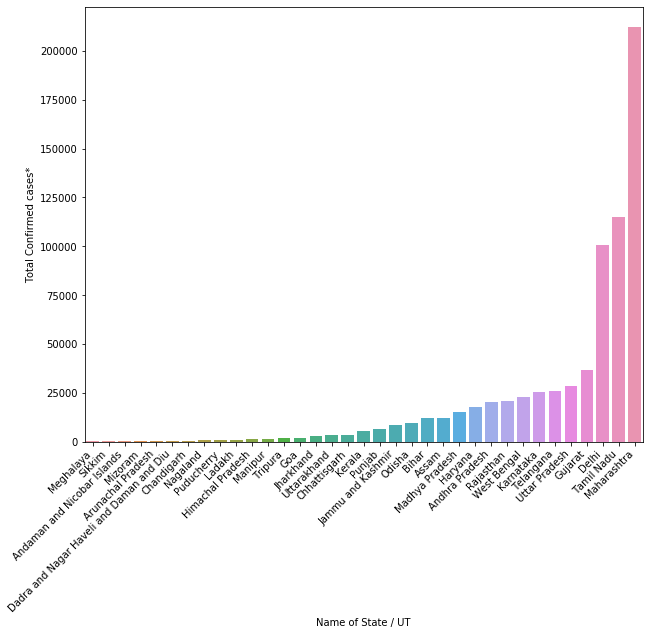

In [168]:
plt.figure(figsize=(10,8))
chart = sns.barplot(x='Name of State / UT',y='Total Confirmed cases*',data=df_sorted)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()


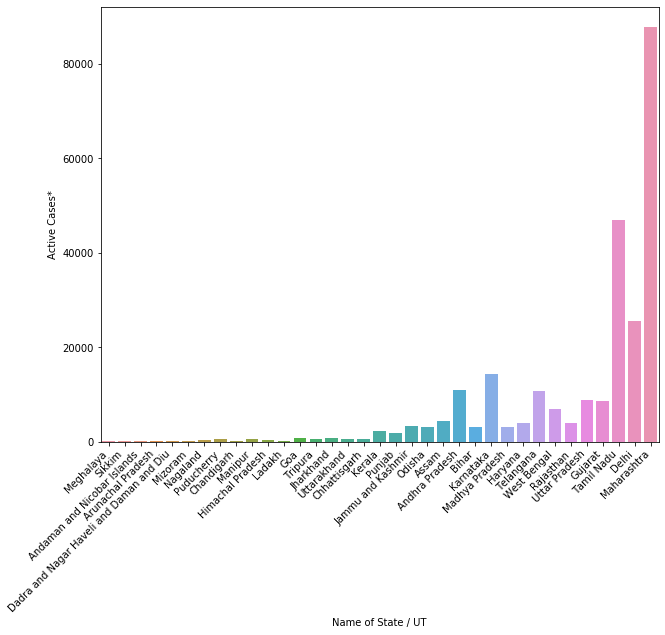

In [169]:
plt.figure(figsize=(10,8))
chart = sns.barplot(x='Name of State / UT',y='Active Cases*',\
                    data=df.sort_values(by='Cured/Discharged/Migrated*',ascending=True))
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

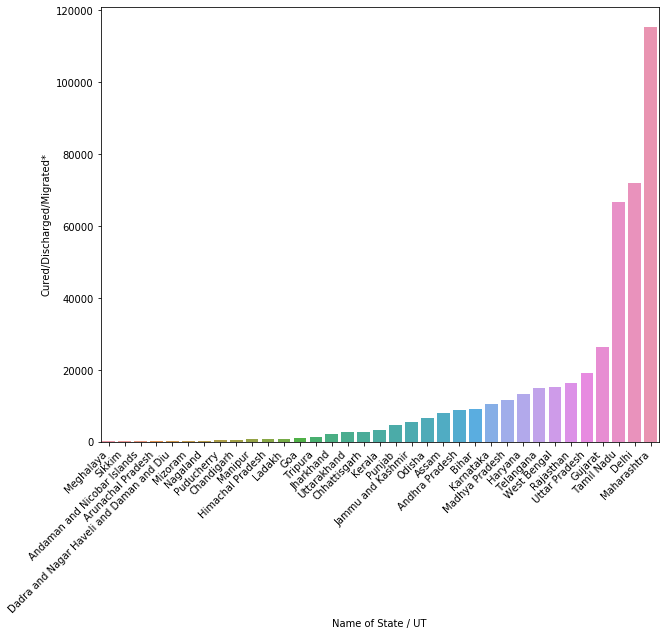

In [170]:
plt.figure(figsize=(10,8))
chart = sns.barplot(x='Name of State / UT',y='Cured/Discharged/Migrated*',data=df.sort_values(by='Cured/Discharged/Migrated*'\
                                                                                              ,ascending=True))
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In [198]:
import plotly
from urllib.request import urlopen
import json

In [254]:
places2= df[['Name of State / UT','Deaths**']]
places2.head()

,Name of State / UT,Deaths**
0,Andaman and Nicobar Islands,0
1,Andhra Pradesh,239
2,Arunachal Pradesh,2
3,Assam,14
4,Bihar,97


 # Folium Choropleth

In [261]:
covid_map=folium.Map(
    location=[20.5937, 78.9629],  # Coordinates of India
    zoom_start=4
)

In [262]:
def mark(i,color):
    # Function to create marker
    folium.Marker(
        location=point, # To give Latitude and Longitude stored in point
        popup=df['Name of State / UT'][i] + " " + str(df['Total Confirmed cases*'][i]),  # Assigning label to the marker as State_name Confirmed covid cases
        icon=folium.Icon(
            color=color,  # Assigning color
            icon='tint',
            icon_color='white'
        )
    ).add_to(covid_map)
  

In [264]:
i=0
for point in location:
    if df['Total Confirmed cases*'][i]>100000:
        # Alert
        mark(i,'darkred')
    elif df['Total Confirmed cases*'][i]>50000 and df['Total Confirmed cases*'][i]<=100000:
        # High Risk
        mark(i,'red')
    elif df['Total Confirmed cases*'][i]>20000 and df['Total Confirmed cases*'][i]<=50000:
        # Risk
        mark(i,'lightred')
    elif df['Total Confirmed cases*'][i]>5000 and df['Total Confirmed cases*'][i]<=20000:
        # Average
        mark(i,'orange')
    elif df['Total Confirmed cases*'][i]>0 and df['Total Confirmed cases*'][i]<=5000:
        # Below average
        mark(i,'green')
    i+=1

# MATPLOTLIB, GEOPANDAS

In [271]:
import geopandas as gpd

In [288]:

df=pd.read_csv('covid_data_7_7_2020.csv')

In [289]:
df.head()

,Name of State / UT,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586,2020-07-07
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400,2020-07-07
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278,2020-07-07
3,Assam,4264,7882,14,12160,26.2006,92.9376,2020-07-07
4,Bihar,3031,8997,97,12125,25.0961,85.3131,2020-07-07


In [275]:
shape_df= gpd.read_file('maps-master/States/Admin2.shp')

In [277]:
shape_df.head()

,ST_NM,geometry
0,Arunachal Pradesh,"POLYGON ((96.08866 29.45997, 96.09428 29.45477..."
1,Assam,"POLYGON ((95.97166 27.96254, 95.97174 27.96227..."
2,Chandigarh,"POLYGON ((76.77175 30.79498, 76.77231 30.79420..."
3,Karnataka,"POLYGON ((77.32647 18.45884, 77.32648 18.45803..."
4,Manipur,"POLYGON ((94.57315 25.69156, 94.57522 25.69094..."


In [297]:
df.rename(columns={"Name of State / UT": "ST_NM"},inplace=True)
df.head()

,ST_NM,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586,2020-07-07
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400,2020-07-07
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278,2020-07-07
3,Assam,4264,7882,14,12160,26.2006,92.9376,2020-07-07
4,Bihar,3031,8997,97,12125,25.0961,85.3131,2020-07-07


In [302]:
merged= shape_df.merge(df, on = "ST_NM", how = "left")
merged.head()

,ST_NM,geometry,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude,Date
0,Arunachal Pradesh,"POLYGON ((96.08866 29.45997, 96.09428 29.45477...",176.0,92.0,2.0,270.0,28.2180,94.7278,2020-07-07
1,Assam,"POLYGON ((95.97166 27.96254, 95.97174 27.96227...",4264.0,7882.0,14.0,12160.0,26.2006,92.9376,2020-07-07
2,Chandigarh,"POLYGON ((76.77175 30.79498, 76.77231 30.79420...",82.0,401.0,6.0,489.0,30.7333,76.7794,2020-07-07
3,Karnataka,"POLYGON ((77.32647 18.45884, 77.32648 18.45803...",14389.0,10527.0,401.0,25317.0,15.3173,75.7139,2020-07-07
4,Manipur,"POLYGON ((94.57315 25.69156, 94.57522 25.69094...",656.0,734.0,0.0,1390.0,24.6637,93.9063,2020-07-07


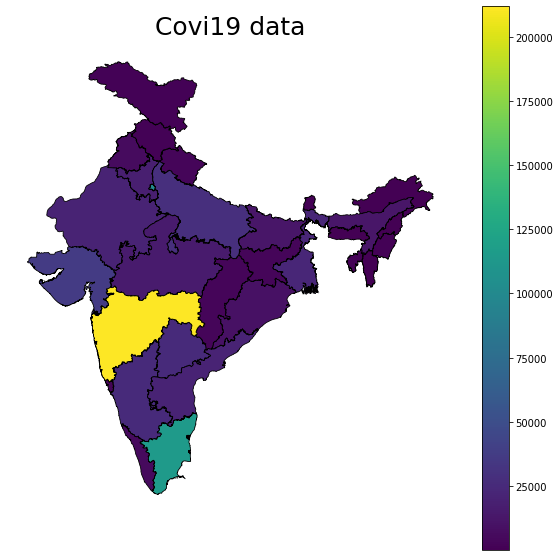

In [346]:
fig, ax = plt.subplots(1, figsize=(10,10))
ax.axis('off')
ax.set_title('Covi19 data', fontdict={"fontsize": '25', 'fontweight' : '10'})
merged.plot(column='Total Confirmed cases*',cmap='viridis',lw=0.8,ax=ax,edgecolor='0',\
            legend=True,markersize=[39.739192, -104.990337])
plt.show()

# GEOPLOT + CHOROPLETH

In [67]:
import geoplot as gplt
import geoplot.crs as gcrs

<Figure size 720x720 with 0 Axes>

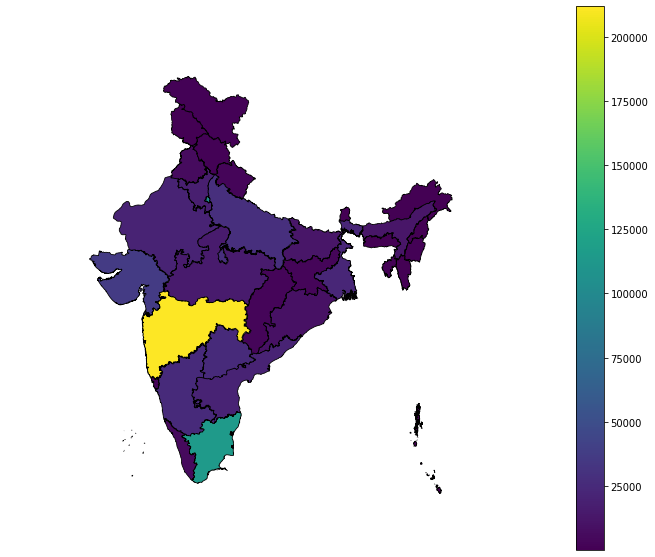

In [370]:
plt.figure(figsize=(10,10))
gplt.choropleth(df=merged,projection=gcrs.AlbersEqualArea(),cmap='viridis',\
               hue='Total Confirmed cases*',edgecolor='k',legend=True,lw=0.8,figsize=(12,10))
plt.show()

# FOLIUM + CHOROPLETH

In [68]:
import folium as flm
from folium import plugins
import ipywidgets
import geocoder
import geopy
import numpy as np
import pandas as pd
import json

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

In [432]:
df= pd.read_csv('covid_data_7_7_2020.csv')

In [433]:
with open('india_telengana.geojson') as response:
    states = json.load(response)

In [380]:
states

{'type': 'FeatureCollection',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'ID_0': 105,
    'ISO': 'IND',
    'NAME_0': 'India',
    'ID_1': 1,
    'NAME_1': 'Andaman and Nicobar'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[93.78772735595709, 6.85264015197771],
       [93.78849029541021, 6.8525710105896],
       [93.789047241211, 6.8525710105896],
       [93.789047241211, 6.852291107177678],
       [93.78967285156278, 6.852291107177678],
       [93.78987884521513, 6.852013111114729],
       [93.79015350341814, 6.851944923400936],
       [93.79064178466825, 6.851666927337817],
       [93.79077911376959, 6.851388931274641],
       [93.79091644287126, 6.851041793823242],
       [93.79050445556658, 6.850625038147029],
       [93.79029083251947, 6.85034704208374],
       [93.7900009155274, 6.850278854370117],
       [93.7894821166995, 6.84990310668968],
       [93.78900146484392,

In [425]:
for i in states['features']:
    i['id']=i['properties']['NAME_1']
    

In [434]:
covid_map=folium.Map(
    location=[20.5937, 78.9629],  # Coordinates of India
    zoom_start=4)

In [436]:
flm.Choropleth(geo_data=states, name='choropleth',data=df,columns=['Name of State / UT', 'Total Confirmed cases*'],\
              key_on='feature.properties.NAME_1', fill_color='Purples',fill_opacity=0.5).add_to(covid_map)
#key_on = 'feature.id'

In [437]:
flm.LayerControl().add_to(covid_map)

In [ ]:
covid_map

# BOKEH + CHOROPLETH

In [2]:
from bokeh.io import show
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar

In [3]:
df= pd.read_csv('covid_2020.csv')
df.rename(columns={'Name of State / UT':'ST_NM'},inplace=True)
df.head()

,ST_NM,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278
3,Assam,4264,7882,14,12160,26.2006,92.9376
4,Bihar,3031,8997,97,12125,25.0961,85.3131


In [4]:
df.rename(columns={'Name of State / UT':'ST_NM'},inplace=True)
df.head()

,ST_NM,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude
0,Andaman and Nicobar Islands,67,74,0,141,11.7401,92.6586
1,Andhra Pradesh,10860,8920,239,20019,15.9129,79.7400
2,Arunachal Pradesh,176,92,2,270,28.2180,94.7278
3,Assam,4264,7882,14,12160,26.2006,92.9376
4,Bihar,3031,8997,97,12125,25.0961,85.3131


In [7]:
import geopandas as gpd
import json
state_gpd = gpd.read_file('maps-master/States/Admin2.shp')
state_gpd.head()

,ST_NM,geometry
0,Arunachal Pradesh,"POLYGON ((96.08866 29.45997, 96.09428 29.45477..."
1,Assam,"POLYGON ((95.97166 27.96254, 95.97174 27.96227..."
2,Chandigarh,"POLYGON ((76.77175 30.79498, 76.77231 30.79420..."
3,Karnataka,"POLYGON ((77.32647 18.45884, 77.32648 18.45803..."
4,Manipur,"POLYGON ((94.57315 25.69156, 94.57522 25.69094..."


In [8]:
merged= state_gpd.merge(df,on='ST_NM',how='left')
merged.head()

,ST_NM,geometry,Active Cases*,Cured/Discharged/Migrated*,Deaths**,Total Confirmed cases*,latitude,longitude
0,Arunachal Pradesh,"POLYGON ((96.08866 29.45997, 96.09428 29.45477...",176.0,92.0,2.0,270.0,28.2180,94.7278
1,Assam,"POLYGON ((95.97166 27.96254, 95.97174 27.96227...",4264.0,7882.0,14.0,12160.0,26.2006,92.9376
2,Chandigarh,"POLYGON ((76.77175 30.79498, 76.77231 30.79420...",82.0,401.0,6.0,489.0,30.7333,76.7794
3,Karnataka,"POLYGON ((77.32647 18.45884, 77.32648 18.45803...",14389.0,10527.0,401.0,25317.0,15.3173,75.7139
4,Manipur,"POLYGON ((94.57315 25.69156, 94.57522 25.69094...",656.0,734.0,0.0,1390.0,24.6637,93.9063


In [9]:
merged_json=json.loads(merged.to_json())


In [10]:
merged_json

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'Active Cases*': 176.0,
    'Cured/Discharged/Migrated*': 92.0,
    'Deaths**': 2.0,
    'ST_NM': 'Arunachal Pradesh',
    'Total Confirmed cases*': 270.0,
    'latitude': 28.218000000000004,
    'longitude': 94.7278},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[96.08866297155515, 29.459965441753653],
      [96.09427767204961, 29.454768639867538],
      [96.10259926149811, 29.44360804717935],
      [96.11454849689727, 29.425727378332056],
      [96.12526081593053, 29.415799567201184],
      [96.14049538346147, 29.405920796785615],
      [96.15122046396168, 29.39734506003835],
      [96.15896228431909, 29.38113263161482],
      [96.16495601637126, 29.374671760387447],
      [96.17635321457044, 29.362480177678165],
      [96.18139559031255, 29.353411661201005],
      [96.1868125213073, 29.342357645997716],
      [96.18613719841943, 29.336957407705366],
      [96.18402044870813, 29

In [11]:
json_data = json.dumps(merged_json)
geosource = GeoJSONDataSource(geojson = json_data)

In [32]:
from bokeh.palettes import brewer,d3
palette=brewer['YlGnBu'][6]

In [33]:
palette = palette[::-1]

In [34]:
color_mapper = LinearColorMapper(palette = palette, low=merged['Total Confirmed cases*'].min(), \
                                 high = merged['Total Confirmed cases*'].max(),nan_color = '#d9d9d9')
                       
                       
                       

In [35]:
tick_labels = {'100000': '>100000'}

In [41]:
from bokeh.models import HoverTool
hover = HoverTool(tooltips = [ ('State_Name','@ST_NM'),('Cases','@(Total Confirmed cases*)')])

In [43]:
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)

In [44]:
mapp=figure(title = 'Number of Covid-19 cases', plot_height = 600 ,\
            plot_width = 950, toolbar_location = None, tools = [hover])

In [ ]:
mapp.xgrid.grid_line_color = None
mapp.ygrid.grid_line_color = None

In [47]:
mapp.patches('xs','ys', source = geosource,fill_color = {'field' :'Cases'\
                                                          , 'transform' : color_mapper}, line_color = 'black',\
              line_width = 0.25, fill_alpha = 1)
#Specify layout
mapp.add_layout(color_bar, 'right')

In [50]:

show(mapp)